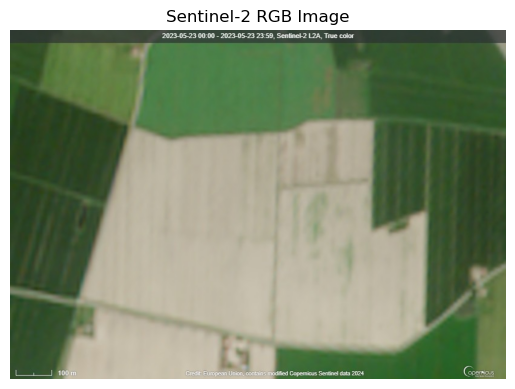

In [ ]:
import os
import cv2
import matplotlib.pyplot as plt

# Step 1: Load Sentinel-2 RGB Images
def load_images(directory):
    images = []
    for filename in sorted(os.listdir(directory)):
        if filename.endswith(".jpg") or filename.endswith(".png"):
            img = cv2.imread(os.path.join(directory, filename))
            images.append(img)
    return images

# Directory where Sentinel-2 RGB images are stored
directory = "./im"

# Load RGB images
rgb_images = load_images(directory)

# Display an example image
plt.imshow(cv2.cvtColor(rgb_images[0], cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.title('Sentinel-2 RGB Image')
plt.show()


In [6]:
import os
import time
from PIL import Image
import numpy as np
import tensorflow as tf
import tensorflow_hub as hub
import matplotlib.pyplot as plt

os.environ["TFHUB_DOWNLOAD_PROGRESS"] = "True"

# Declaring Constants
SAVED_MODEL_PATH = "https://tfhub.dev/captain-pool/esrgan-tf2/1"

def preprocess_image(image_path):
    """ Loads image from path and preprocesses to make it model ready
        Args:
          image_path: Path to the image file
    """
    hr_image = tf.image.decode_image(tf.io.read_file(image_path))

    if hr_image.shape[-1] == 4:
        hr_image = hr_image[...,:-1]
    hr_size = (tf.convert_to_tensor(hr_image.shape[:-1]) // 4) * 4
    hr_image = tf.image.crop_to_bounding_box(hr_image, 0, 0, hr_size[0], hr_size[1])
    hr_image = tf.cast(hr_image, tf.float32)
    return tf.expand_dims(hr_image, 0)

def save_image(image, filename):
    """
      Saves unscaled Tensor Images.
      Args:
        image: 3D image tensor. [height, width, channels]
        filename: Name of the file to save.
    """
    if not isinstance(image, Image.Image):
        image = tf.clip_by_value(image, 0, 255)
        image = Image.fromarray(tf.cast(image, tf.uint8).numpy())
    image.save("%s.jpg" % filename)
    print("Saved as %s.jpg" % filename)

%matplotlib inline
def plot_image(image, title=""):
    """
      Plots images from image tensors.
      Args:
        image: 3D image tensor. [height, width, channels].
        title: Title to display in the plot.
    """
    image = np.asarray(image)
    image = tf.clip_by_value(image, 0, 255)
    image = Image.fromarray(tf.cast(image, tf.uint8).numpy())
    plt.imshow(image)
    plt.axis("off")
    plt.title(title)


In [5]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Load the ESRGAN model
model = hub.load(SAVED_MODEL_PATH)

# Directory containing your images
image_dir = './im/'

# Process each image in the directory
for image_name in os.listdir(image_dir):
    if image_name.endswith(".png") or image_name.endswith(".jpg"):
        image_path = os.path.join(image_dir, image_name)

        # Preprocess the image
        hr_image = preprocess_image(image_path)

        # Perform super resolution
        start = time.time()
        fake_image = model(hr_image)
        fake_image = tf.squeeze(fake_image)
        print("Time taken: %.2fs" % (time.time() - start))

        # Save and plot the results
        save_image(fake_image, filename=f"Enhanced_{image_name.split('.')[0]}")
        plot_image(fake_image, title=f"Enhanced {image_name.split('.')[0]}")


Model loaded successfully.
Time taken: 146.13s
Saved as Enhanced_2024-06-01.jpg
Time taken: 134.57s
Saved as Enhanced_2024-04-12.jpg
Time taken: 136.18s
Saved as Enhanced_2024-04-02.jpg
Time taken: 130.80s
Saved as Enhanced_2024-03-23.jpg
Time taken: 144.89s
Saved as Enhanced_2024-01-23.jpg
Time taken: 132.80s
Saved as Enhanced_2023-12-19.jpg
Time taken: 134.72s
Saved as Enhanced_2023-11-29.jpg
Time taken: 132.55s
Saved as Enhanced_2023-10-10.jpg
Time taken: 138.49s
Saved as Enhanced_2023-09-25.jpg
Time taken: 138.85s
Saved as Enhanced_2023-09-10.jpg
Time taken: 133.55s
Saved as Enhanced_2023-08-16.jpg
Time taken: 132.26s
Saved as Enhanced_2023-08-11.jpg
Time taken: 134.40s
Saved as Enhanced_2023-08-06.jpg
Time taken: 145.52s
Saved as Enhanced_2023-07-17.jpg
Time taken: 131.13s
Saved as Enhanced_2023-07-07.jpg
Time taken: 136.60s
Saved as Enhanced_2023-06-17.jpg
Time taken: 129.38s
Saved as Enhanced_2023-05-23.jpg


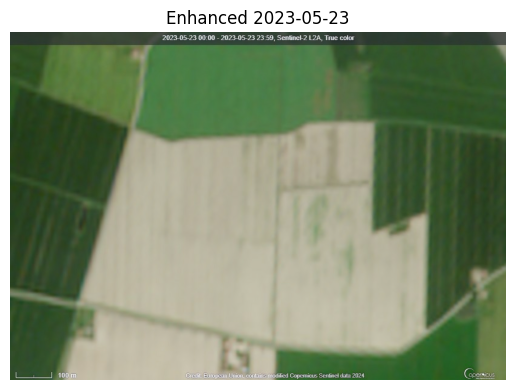

In [12]:
import os
import time
from PIL import Image
import numpy as np
import tensorflow as tf
import tensorflow_hub as hub
import matplotlib.pyplot as plt

# Load the ESRGAN model
SAVED_MODEL_PATH = "https://tfhub.dev/captain-pool/esrgan-tf2/1"
model = hub.load(SAVED_MODEL_PATH)
print("Model loaded successfully.")

def preprocess_image(image_path):
    """ Loads image from path and preprocesses to make it model ready """
    hr_image = tf.image.decode_image(tf.io.read_file(image_path))
    if hr_image.shape[-1] == 4:
        hr_image = hr_image[...,:-1]
    hr_size = (tf.convert_to_tensor(hr_image.shape[:-1]) // 4) * 4
    hr_image = tf.image.crop_to_bounding_box(hr_image, 0, 0, hr_size[0], hr_size[1])
    hr_image = tf.cast(hr_image, tf.float32)
    return tf.expand_dims(hr_image, 0)

def save_image(image, filename):
    """ Saves unscaled Tensor Images """
    if not isinstance(image, Image.Image):
        image = tf.clip_by_value(image, 0, 255)
        image = Image.fromarray(tf.cast(image, tf.uint8).numpy())
    image.save("%s.jpg" % filename)
    print("Saved as %s.jpg" % filename)

def plot_image(image, title=""):
    """ Plots images from image tensors """
    image = np.asarray(image)
    image = tf.clip_by_value(image, 0, 255)
    image = Image.fromarray(tf.cast(image, tf.uint8).numpy())
    plt.imshow(image)
    plt.axis("off")
    plt.title(title)

# Directory containing your images
image_dir = '/content/drive/MyDrive/ColabNotebooks/im/'

# Process each image in the directory
for image_name in os.listdir(image_dir):
    if image_name.endswith(".png") or image_name.endswith(".jpg"):
        image_path = os.path.join(image_dir, image_name)

        # Preprocess the image
        hr_image = preprocess_image(image_path)

        # Perform super resolution
        start = time.time()
        fake_image = model(hr_image)
        fake_image = tf.squeeze(fake_image)
        print("Time taken: %.2fs" % (time.time() - start))

        # Save and plot the results
        save_image(fake_image, filename=f"Enhanced_{image_name.split('.')[0]}")
        plot_image(fake_image, title=f"Enhanced {image_name.split('.')[0]}")


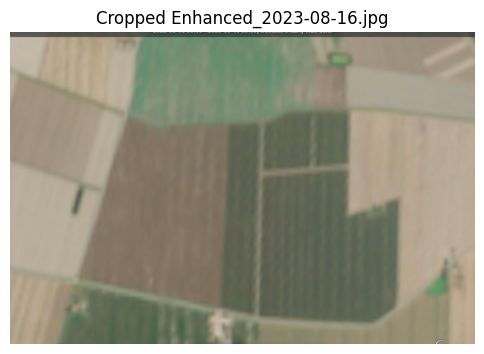

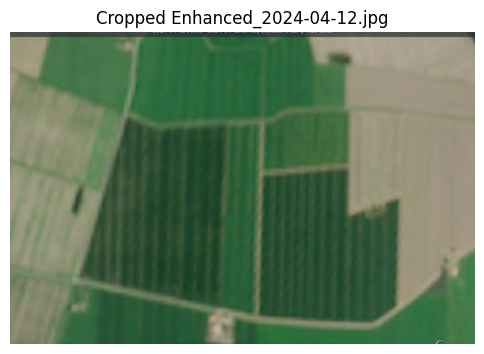

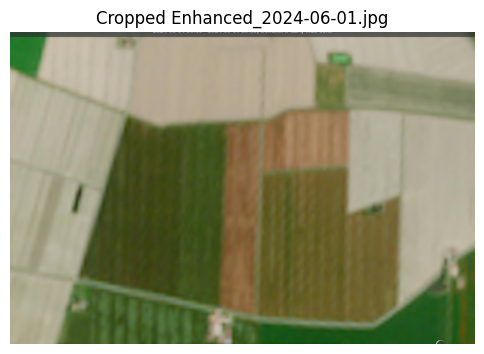

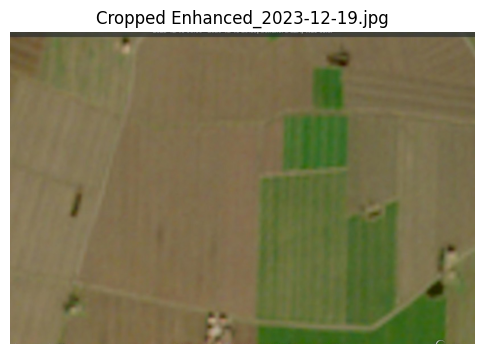

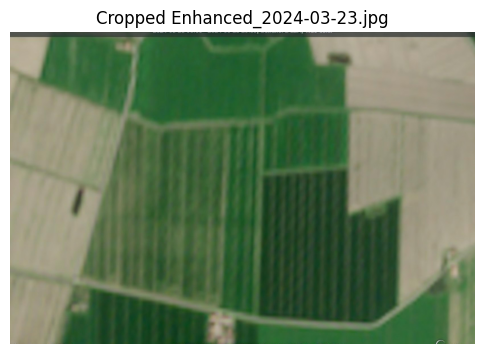

...

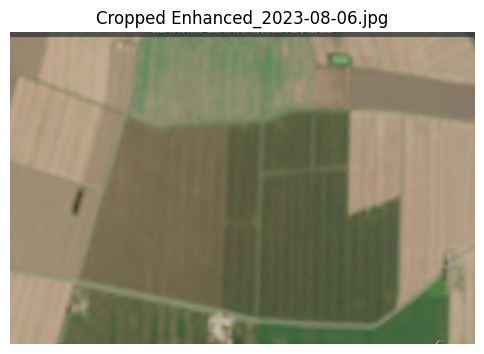

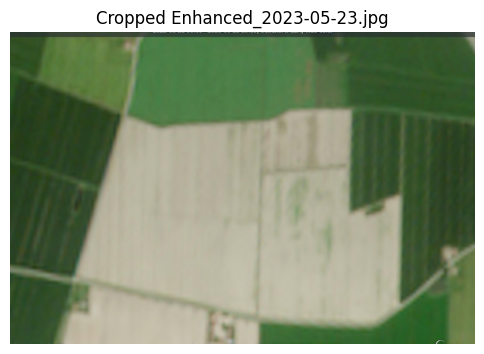

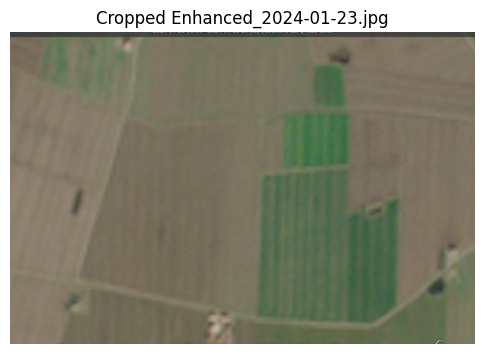

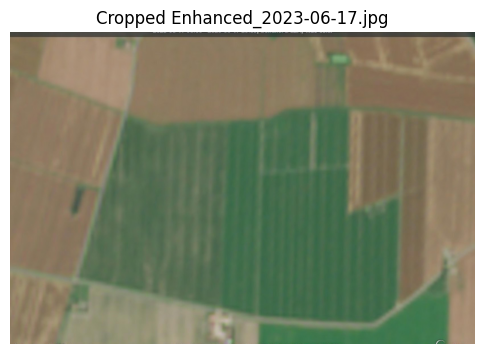

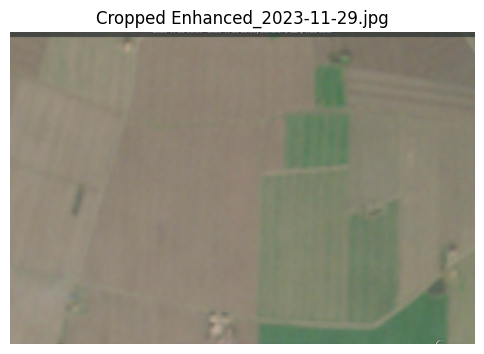

Displaying cropped images completed.


In [23]:
from PIL import Image
import os
import matplotlib.pyplot as plt

# Directory containing your enhanced images
image_dir = '/content/'

# Process each image in the directory
for image_name in os.listdir(image_dir):
    if image_name.startswith("Enhanced") and (image_name.endswith(".png") or image_name.endswith(".jpg")):
        image_path = os.path.join(image_dir, image_name)

        # Load the enhanced image
        image = Image.open(image_path)

        # Define crop dimensions (adjust as needed)
        top_crop = 50  # Adjust to crop from the top
        bottom_crop = 50  # Adjust to crop from the bottom

        # Perform cropping
        width, height = image.size
        cropped_image = image.crop((0, top_crop, width, height - bottom_crop))

        # Display the cropped image
        plt.figure(figsize=(6, 6))
        plt.imshow(cropped_image)
        plt.axis('off')
        plt.title(f"Cropped {image_name}")
        plt.show()

print("Displaying cropped images completed.")


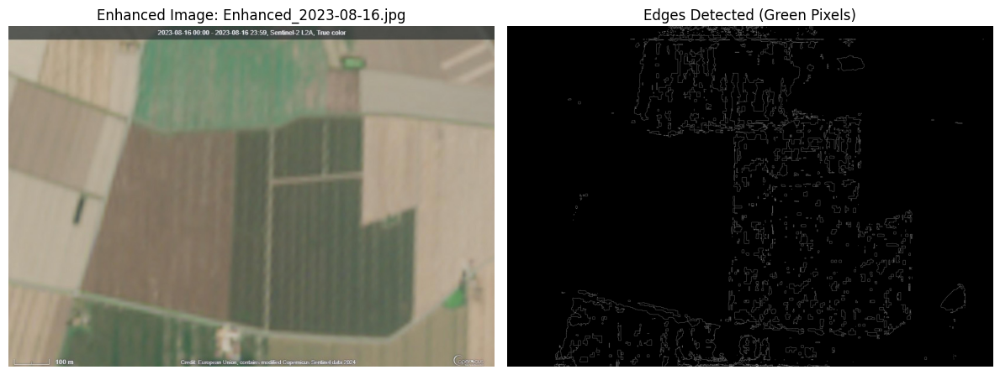

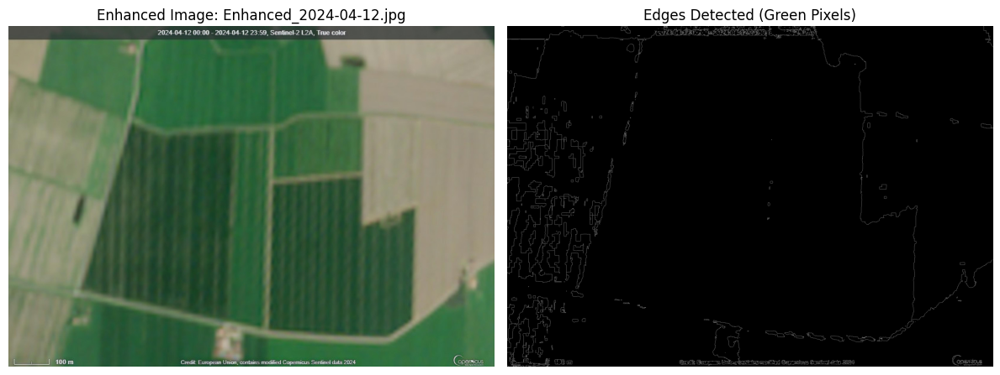

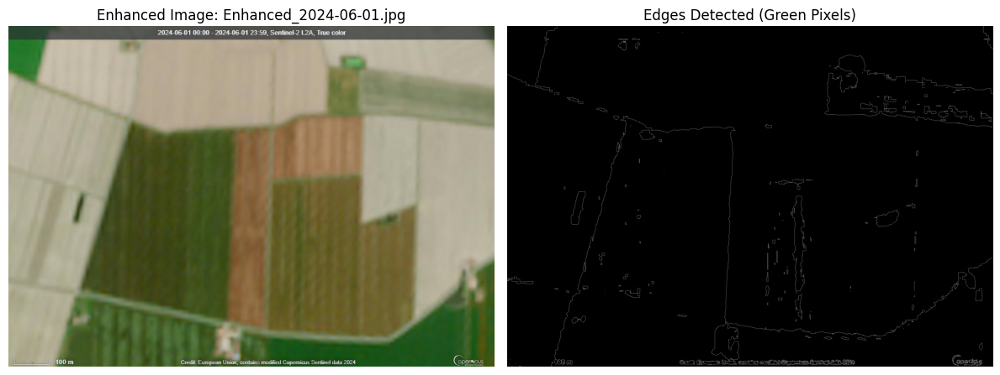

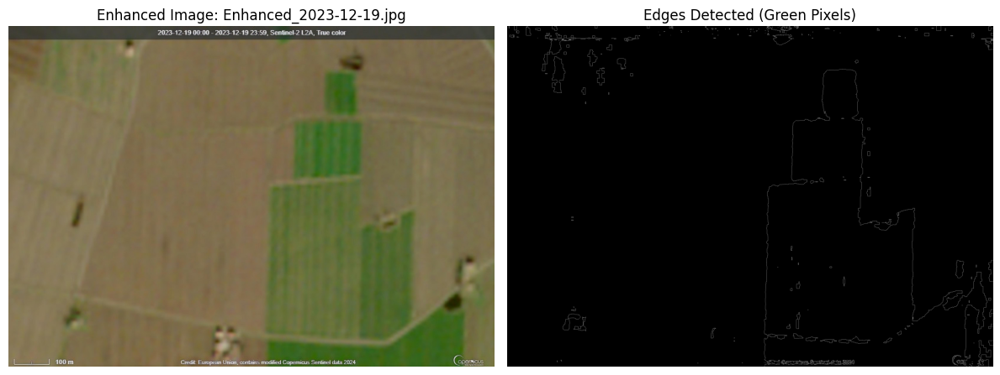

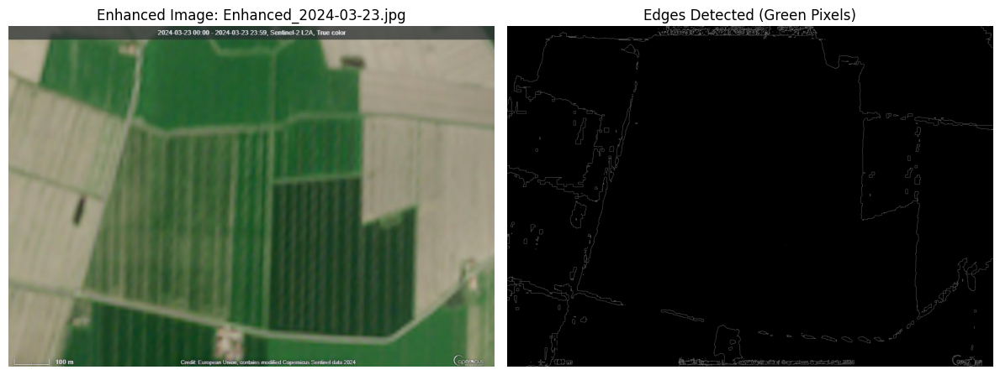

...

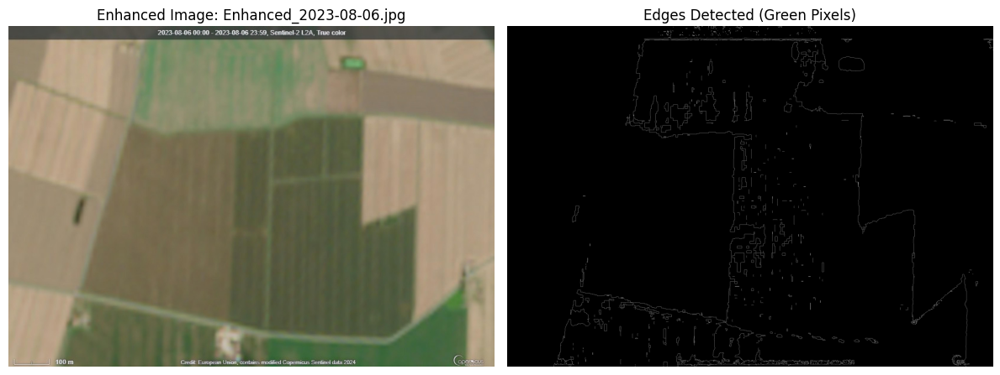

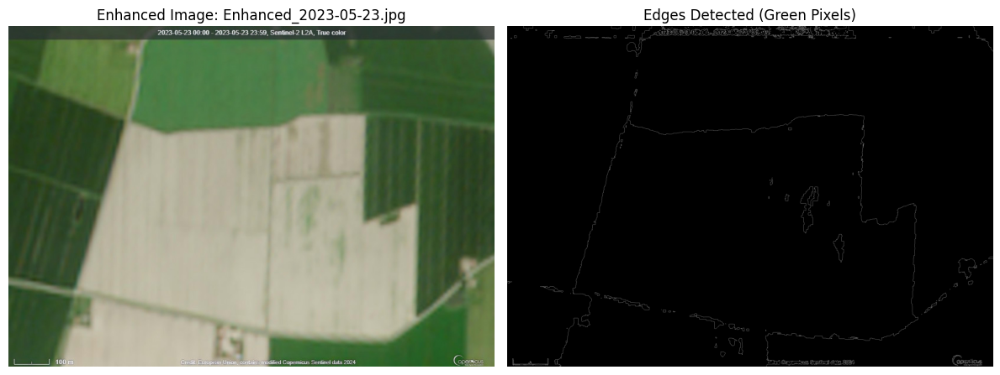

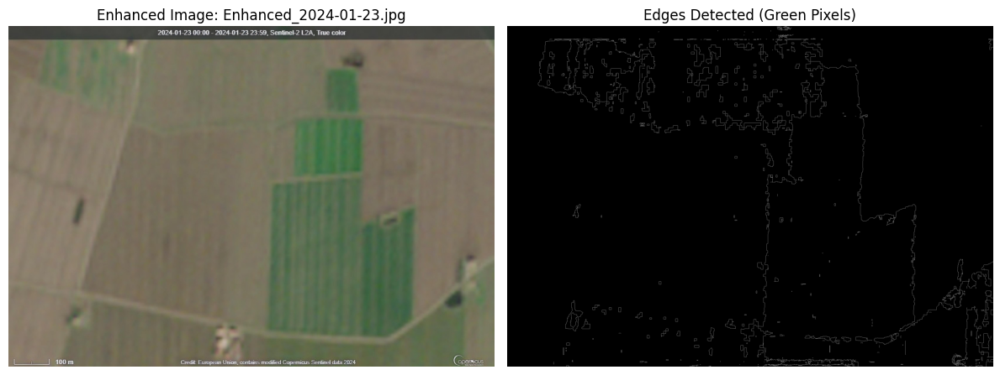

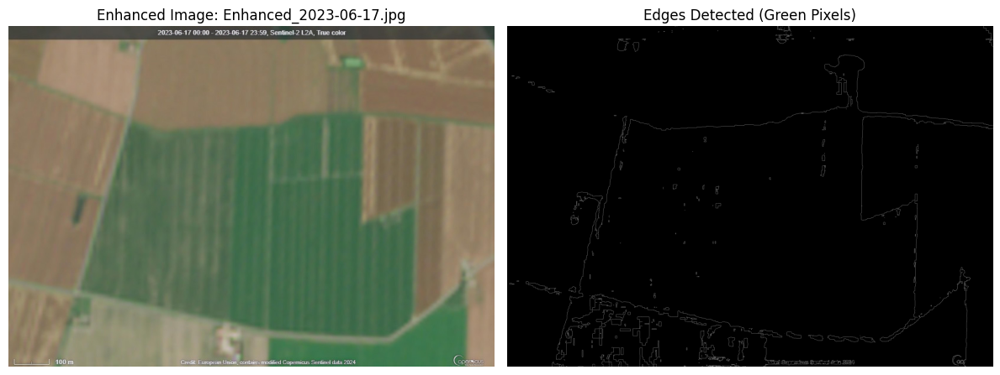

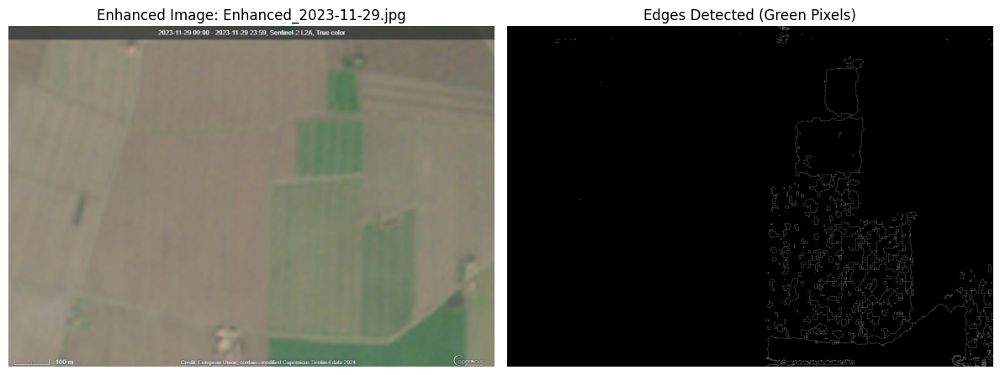

Displaying images with edges based on green pixels completed.


In [26]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Directory containing your enhanced images
image_dir = '/content/'

# Process each image in the directory
for image_name in os.listdir(image_dir):
    if image_name.startswith("Enhanced") and (image_name.endswith(".png") or image_name.endswith(".jpg")):
        image_path = os.path.join(image_dir, image_name)

        # Load the enhanced image
        enhanced_image = cv2.imread(image_path)

        # Convert BGR to RGB (if needed for displaying with matplotlib)
        enhanced_rgb = cv2.cvtColor(enhanced_image, cv2.COLOR_BGR2RGB)

        # Convert image to HSV color space
        hsv = cv2.cvtColor(enhanced_image, cv2.COLOR_BGR2HSV)

        # Define range of green color in HSV
        lower_green = np.array([30, 50, 50])
        upper_green = np.array([90, 255, 255])

        # Threshold the HSV image to get only green colors
        mask = cv2.inRange(hsv, lower_green, upper_green)

        # Apply Canny edge detection on the green mask
        edges = cv2.Canny(mask, threshold1=100, threshold2=200)

        # Display the original enhanced image and its edges based on green pixels
        plt.figure(figsize=(12, 6))

        plt.subplot(1, 2, 1)
        plt.imshow(enhanced_rgb)
        plt.title(f"Enhanced Image: {image_name}")
        plt.axis('off')

        plt.subplot(1, 2, 2)
        plt.imshow(edges, cmap='gray')
        plt.title(f"Edges Detected (Green Pixels)")
        plt.axis('off')

        plt.tight_layout()
        plt.show()

print("Displaying images with edges based on green pixels completed.")
